# Variable description

### Background study to gain the domain expertise to find the appropriate relationships

In [ ]:
#import pandas as pd
#import os
#df = data 
#df['date'] = pd.to_datetime(df['date'])
#df['year'] = df['date'].dt.year
#df['month'] = df['date'].dt.strftime('%b') 
#grouped = df.groupby(['year', 'month'])
#for (year, month), group in grouped:
#    year_folder = str(year)
#    month_folder = month
#    os.makedirs(os.path.join(year_folder, month_folder), exist_ok=True)
#    group = group.drop(['year', 'month'], axis=1)
#    file_path = os.path.join(year_folder, month_folder, f"{year}_{month}.csv")
#    group.to_csv(file_path, index=False)
#    print(f"Saved: {file_path}")

# 🌞 Relationships Between Solar and Environmental Variables

## 1. ☀ Solar Radiation and Solar Energy

**Solar Radiation (W/m²)** represents the instantaneous measure of sunlight energy received at a specific location.

**Solar Energy (MJ/m²)** is the cumulative energy received over time, typically aggregated daily, hourly, or monthly. The conversion from solar radiation to solar energy involves integrating radiation over time:

$$ \text{Solar Energy (MJ/m}^2\text{)} = \int \text{Solar Radiation (W/m}^2\text{)} \, dt $$

---

## 2. 🔋 Solar Radiation, Solar Energy, and PV Output

**PV Output (kWh)** depends significantly on solar radiation, as photovoltaic (PV) panels convert sunlight into electricity. Several factors affect this conversion:

- **Solar Energy** - More solar energy generally results in higher PV output, assuming constant efficiency.
- **Panel Efficiency** - Determines how much of the solar energy is converted to electricity.
- **Panel Area** - Affects the total energy captured.

A simplified relationship can be expressed as:

$$ \text{PV Output (kWh)} \approx \text{Solar Energy (MJ/m}^2\text{)} \times \text{Panel Efficiency} \times \text{Panel Area} \times \text{Conversion Factor} $$

where the conversion factor adjusts MJ to kWh.

---

## 3. 🌦 Weather Variables Affecting Solar Radiation

- **Cloud Cover (%)** - More clouds mean less sunlight reaches the panels, reducing both solar energy and PV output.
- **Humidity** - Can influence cloud formation and atmospheric scattering, indirectly affecting solar radiation.
- **Pressure (millibars)** - While not directly affecting solar radiation, pressure changes can indicate weather patterns influencing cloud cover.

---

## 4. 🌡 Temperature Effects

- **Temp Min & Temp Max** - Temperature fluctuations impact PV panel efficiency:
  - High temperatures decrease efficiency due to increased electrical resistance and overheating.
  - Low temperatures can improve efficiency slightly but might coincide with reduced solar radiation due to overcast or snowy conditions.

---

## 5. 🛡 UV Index

The **UV Index** indicates solar intensity, particularly in the shorter wavelength range. While PV panels primarily use visible and infrared light, high UV indices often correlate with strong solar radiation. UV levels are influenced by:

- **Cloud Cover** - Can significantly reduce UV radiation.
- **Altitude** - Higher altitudes receive more UV radiation due to reduced atmospheric filtering.

---

## 6. 🌧 Precipitation and PV Output

**Precipitation (mm)** can influence PV performance by:

- **Cleaning Panels** - Light rain can wash away dust and improve efficiency.
- **Obstructing Sunlight** - Heavy rain and cloud cover reduce solar radiation, lowering PV output.

---

This document provides insights into how solar radiation, environmental factors, and PV output are interconnected. Understanding these relationships helps optimize solar energy utilization and forecasting. 🌎⚡


### Importing and validating the dataframe

In [ ]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import time
from functools import wraps
from typing import Any, Callable
import logging
import polars as pl
import dask.dataframe as dd
from ydata_profiling import ProfileReport
from scipy import stats
from scipy.stats import shapiro
from statsmodels.stats.stattools import omni_normtest
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.pipeline import make_pipeline
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from torch.utils.data import DataLoader, TensorDataset
from dotenv import load_dotenv
import getpass
import os

### Setting up the basic utility functions like logger and execution time counter

In [ ]:
class Logger:
    """Custom logger class for consistent logging across the application"""
    
    def __init__(self, name: str, log_file: str = 'app.log', level: int = logging.INFO):
        self.logger = logging.getLogger(name)
        self.logger.setLevel(level)
        
        # Prevent adding multiple handlers
        if not self.logger.hasHandlers():
            formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')

            # Create log directory if needed
            if log_file and os.path.dirname(log_file):
                os.makedirs(os.path.dirname(log_file), exist_ok=True)
            
            # File handler
            file_handler = logging.FileHandler(log_file)
            file_handler.setFormatter(formatter)
            self.logger.addHandler(file_handler)

            # Console handler
            console_handler = logging.StreamHandler()
            console_handler.setFormatter(formatter)
            self.logger.addHandler(console_handler)
    
    def get_logger(self) -> logging.Logger:
        return self.logger

def timer_decorator(func: Callable) -> Callable:
    """Decorator to measure execution time of functions"""
    @wraps(func)
    def wrapper(*args, **kwargs):
        start_time = time.time()
        result = func(*args, **kwargs)
        end_time = time.time()
        execution_time = end_time - start_time

        # Fetch or create a logger
        logger = kwargs.get('logger')
        if logger is None:
            logger = Logger(func.__module__).get_logger()

        logger.info(f"Function {func.__name__} took {execution_time:.4f} seconds")
        return result
    return wrapper
#########################################################################################################
class DataFrameUtils:
    """Utility class for common DataFrame operations across different libraries"""
    @staticmethod
    @timer_decorator
    def load_data(df: Any, logger: logging.Logger = None) -> Any:
        """Display first `n` rows of DataFrame, handling different DataFrame types"""
        
        if logger is None:
            logger = Logger('DataFrameUtils').get_logger()
        
        try:
            return df
        except Exception as e:
            logger.error(f"Error displaying head: {str(e)}")
            raise
    @staticmethod
    @timer_decorator
    def display_head(df: Any, n: int = 5, logger: logging.Logger = None) -> Any:
        """Display first `n` rows of DataFrame, handling different DataFrame types"""
        
        if logger is None:
            logger = Logger('DataFrameUtils').get_logger()
        
        try:
            return df.head(n)
        except Exception as e:
            logger.error(f"Error displaying head: {str(e)}")
            raise

    @staticmethod
    @timer_decorator
    def display_info(df: Any, logger: logging.Logger = None) -> None:
        """Display DataFrame info, describe, and column names safely"""
        
        if logger is None:
            logger = Logger('DataFrameUtils').get_logger()

        try:
            if df is None:
                logger.error("DataFrame is None. Cannot display info.")
                return
            
            logger.info("Displaying DataFrame info:")

            if isinstance(df, pd.DataFrame):
                return [df.info(), df.describe(), df.columns]
            else:
                logger.error("cannot display dataframe information.")
                
        except Exception as e:
            logger.error(f"Error while displaying DataFrame info: {str(e)}")
            raise
##################################################################################################################################
class EDAUtils:
    """Utility class for performing Exploratory Data Analysis (EDA)"""
    @staticmethod
    @timer_decorator
    def generate_profile_report(df: Any, logger: logging.Logger = None, title: str = "Pandas Profiling Report") -> None:
        """Generate an interactive Pandas Profiling report."""
        try:
            logger.info("Generating Pandas Profiling report...")
            profile = ProfileReport(df, title=title, explorative=True)
            profile.to_notebook_iframe()  # Display report in Jupyter Notebook
            logger.info("Pandas Profiling report generated successfully.")
        except Exception as e:
            logger.error(f"Error generating Pandas Profiling report: {str(e)}")
            raise

############################################################################################################
class datacleaningutils:
    @staticmethod
    def _fill_nulls_with_window_mean(series: pd.Series, window: int = 3) -> tuple[pd.Series, list]:
        """
        Fill null values in a series with the average of 3 observations before and after.
        Returns the filled series and a list of tuples with null index, replacement value, before values, and after values.
        """
        null_info = []
        series_copy = series.copy()
        
        for idx in series[series.isnull()].index:
            before_vals = series[max(0, idx - window):idx][~series[max(0, idx - window):idx].isnull()]
            after_vals = series[idx + 1:idx + window + 1][~series[idx + 1:idx + window + 1].isnull()]
            
            before_vals = before_vals.tail(3).values
            after_vals = after_vals.head(3).values
            
            combined_vals = pd.Series(list(before_vals) + list(after_vals))
            if len(combined_vals) > 0:
                replacement_value = combined_vals.mean()
                series_copy[idx] = replacement_value
                null_info.append((idx, replacement_value, before_vals, after_vals))
            else:
                null_info.append((idx, None, before_vals, after_vals))
        
        return series_copy, null_info

    @staticmethod
    def _create_null_info_table(null_info: list) -> pd.DataFrame:
        """
        Create a DataFrame from null information for display.
        """
        return pd.DataFrame({
            'Index': [info[0] for info in null_info],
            'Replacement Value': [info[1] if info[1] is not None else 'No valid values to average' for info in null_info],
            'Before Values (up to 3)': [', '.join(map(str, info[2])) if len(info[2]) > 0 else 'None' for info in null_info],
            'After Values (up to 3)': [', '.join(map(str, info[3])) if len(info[3]) > 0 else 'None' for info in null_info]
        })

    @staticmethod
    @timer_decorator
    def format_clean_columns(df: Any, logger: logging.Logger = None) -> Any:
        """
        Renaming the columns with the appropriate name and cleaning null values.
        """
        # Check if DataFrame is valid
        if not isinstance(df, pd.DataFrame):
            logger.error("Input must be a pandas DataFrame.")
            raise ValueError("Input must be a pandas DataFrame.")

        # Rename 'Unnamed: 0' to 'date' and convert to datetime
        if 'Unnamed: 0' not in df.columns:
            logger.error("The column 'Unnamed: 0' does not exist in the DataFrame.")
            raise ValueError("The column 'Unnamed: 0' does not exist in the DataFrame.")
        
        df = df.rename(columns={'Unnamed: 0': 'date'})
        logger.info("The column 'Unnamed: 0' has been renamed to 'date'")
        df['date'] = pd.to_datetime(df['date'])
        logger.info("The format of the date column has been changed to datetime")

        # List of variables to clean
        variables = ['precip', 'cloud cover', 'solar radiation', 'humidity', 
                     'pressure', 'UV index', 'temp min', 'temp max', 
                     'solar energy', 'PV output']

        # Check if all variables exist in the DataFrame
        missing_vars = [var for var in variables if var not in df.columns]
        if missing_vars:
            logger.error(f"Missing variables in DataFrame: {missing_vars}")
            raise ValueError(f"Missing variables in DataFrame: {missing_vars}")

        # Clean null values and display information
        logger.info("Replacing null values with the average of 3 observations before and after.")
        for var in variables:
            logger.info(f"Processing null values in '{var}'")
            if df[var].isnull().sum() == 0:
                logger.info(f"No null values found in '{var}'")
                print(f"\nNull values in '{var}': No null values found.")
                continue
            
            # Fill nulls and get replacement details
            df[var], null_info = datacleaningutils._fill_nulls_with_window_mean(df[var])
            logger.info(f"Filled {len(null_info)} null values in '{var}'")
            
            # Create and display null information table
            null_df = datacleaningutils._create_null_info_table(null_info)
            print(f"\nNull values in '{var}':")
            print(null_df.to_string(index=False))
            print("-" * 80)
        
        logger.info("Data cleaning completed.")
        display(df.head(10))
        return df

    @staticmethod
    @timer_decorator
    def dist_columns(df: Any, logger: logging.Logger = None) -> Any:
        """identifying the distribution of the values of the data round the mean value"""
        try:
            if df is not None:
                df = df.drop('date', axis=1)
                display("Skewness")
                display(df.skew())
                logger.info("The skewness of the data has been calculated")
                skewness = df.skew()
                positive_skew = skewness[skewness > 0].index.tolist()
                negative_skew = skewness[skewness < 0].index.tolist()
                print("Columns with Positive Skew:", positive_skew)
                print("Columns with Negative Skew:", negative_skew)
                max_skew = skewness.idxmax()
                min_skew = skewness.idxmin()
                print(f"Column with Maximum Skewness: {max_skew} (value: {skewness[max_skew]:.4f})")
                print(f"Column with Minimum Skewness: {min_skew} (value: {skewness[min_skew]:.4f})")
                display("kurtosis")
                display(df.kurtosis())
                logger.info("The kurtosis of the data has been calculated")
                kurtosis = df.kurtosis()
                positive_kurt = kurtosis[kurtosis>0].index.tolist()
                negative_kurt = kurtosis[kurtosis<0].index.tolist()
                print("Columns with Positive kurtosis:", positive_kurt)
                print("Columns with Negative kurtosis:", negative_kurt)
                max_kurt = kurtosis.idxmax()
                min_kurt = kurtosis.idxmin()
                print(f"Column with Maximum kurtosis: {max_kurt} (value: {kurtosis[max_kurt]:.4f})")
                print(f"Column with Minimum kurtosis: {min_kurt} (value: {kurtosis[min_kurt]:.4f})")
                display("Identifying the categorical columns") 
                categorical_columns = []
                threshold = min(len(df) * 0.10, 12)
                for column in df.columns:
                    if df[column].nunique() <= threshold and column not in categorical_columns:
                        categorical_columns.append(column)
                logger.info("The categorical columns have been identified")
                display(categorical_columns)

        except Exception as e:
            logger.error(f"Error while calculating the distribution of the data: {str(e)}")
            raise
    
    @staticmethod
    @timer_decorator
    def eda_explore(df: Any, logger: logging.Logger = None) -> Any:
        logger.info("pair plot to display the relation ship between each of the variables")
        sns.pairplot(df, diag_kind='kde')
        plt.show()
        df= df.drop('date', axis=1)
        numeric_data = df.select_dtypes(include=['float64', 'int64'])
        data_normalized = numeric_data.copy()
        data_standardized = numeric_data.copy()
        # --- Normalization (Min-Max Scaling) ---
        minmax_scaler = MinMaxScaler()
        data_normalized[numeric_data.columns] = minmax_scaler.fit_transform(numeric_data)
        # --- Standardization (Z-Score Scaling) ---
        standard_scaler = StandardScaler()
        data_standardized[numeric_data.columns] = standard_scaler.fit_transform(numeric_data)
        uv_counts = df["UV index"].value_counts()
        colors = ['skyblue', 'lightcoral', 'lightgreen', 'gold', 'plum', 'lightpink', 'lightseagreen']
        logger.info("bar chart to display the count of each of the category values of the UV ")
        fig = go.Figure(data=[
            go.Bar(
                x=uv_counts.index,
                y=uv_counts.values,
                marker_color=colors,  
                marker_line_color='black', 
                marker_line_width=1.5, 
                hovertemplate='UV Index: %{x}<br>Count: %{y}<extra></extra>'
            )
        ])
        fig.update_layout(
            title='Distribution of UV Index Values',
            xaxis_title='UV Index',
            yaxis_title='Count',
            bargap=0.2,
            template='plotly',
            xaxis_tickangle=45,
            showlegend=False
        )
        fig.show()
        time.sleep(2)
        logger.info("The standardizatrion method is selected for scaling the data")
        logger.info("box plot to look for the spread of data points around the central tendency")
        colors = ['skyblue', 'lightcoral', 'lightgreen', 'gold', 'plum', 'lightpink', 'lightseagreen']
        data_standardized["precip"] = np.log(data_standardized["precip"])
        numeric_data = data_standardized.select_dtypes(include=['float64', 'int64'])
        box_traces = []
        for i, column in enumerate(numeric_data.columns):
            color = colors[i % len(colors)]
            box_traces.append(
                go.Box(
                    y=numeric_data[column],
                    name=column,
                    boxpoints='all',  
                    jitter=0.3,  
                    pointpos=-1.8,  
                    fillcolor=color,  
                    line_color="black",  
                    marker=dict(
                        color='yellow', 
                        opacity=0.4  
                    ),
                    hovertemplate=f'{column}<br>Value: %{{y}}<extra></extra>'
                )
            )
        fig = go.Figure(data=box_traces)
        fig.update_layout(
            title='Boxplot of Numerical Columns',
            xaxis_title='Columns',
            yaxis_title='Values',
            width=1200,  
            height=1200,  
            title_x=0.5,  
            boxmode='overlay',  
            showlegend=True,
        )
        fig.show()


# Step 1 -> Data pre processing

In [6]:
def data_preprocessing():
    logger = Logger('MainApp', 'logs/app.log').get_logger()
    
    data_file = "solarPower_50m.csv"
    
    # Ensuring the file exists in the path
    if not os.path.exists(data_file):
        logger.error(f"The  '{data_file}'is not found in the path")
        return

    # Reading the dataframe
    df_pandas = pd.read_csv(data_file)

    # Use DataFrame utilities
    logger.info("Displaying pandas DataFrame head")
    result_pd = DataFrameUtils.display_head(df_pandas, logger=logger)
    display(result_pd)

    logger.info("Displaying pandas DataFrame info")
    result_pd = DataFrameUtils.display_info(df_pandas, logger=logger)
    for i in result_pd:
        display(i)
    
    # Use EDA utilities
    eda = EDAUtils()
    display(eda.generate_profile_report(df_pandas, logger=logger))
    

if __name__ == "__main__":
    data_preprocessing()


2025-02-14 09:08:36,428 - MainApp - INFO - Displaying pandas DataFrame head
2025-02-14 09:08:36,501 - MainApp - INFO - Function display_head took 0.0002 seconds


,Unnamed: 0,precip,cloud cover,solar radiation,humidity,pressure,UV index,temp min,temp max,solar energy,PV output
0,2019-12-01,0.000,72.0,27.9,87.3,1024.4,2.0,0.9,5.4,2.4,0.748
1,2019-12-02,0.120,41.2,NaN,82.0,1032.6,2.0,-1.1,5.8,3.9,1.122
2,2019-12-03,0.000,59.8,42.5,82.6,1027.7,3.0,2.1,8.2,3.7,1.091
3,2019-12-04,0.096,26.2,43.8,90.6,1020.7,3.0,1.0,6.9,3.7,1.060
4,2019-12-05,0.134,85.2,26.5,91.5,1019.4,2.0,1.9,9.7,2.3,0.712


2025-02-14 09:08:36,618 - MainApp - INFO - Displaying pandas DataFrame info
2025-02-14 09:08:36,619 - MainApp - INFO - Displaying DataFrame info:
2025-02-14 09:08:36,707 - MainApp - INFO - Function display_info took 0.0885 seconds


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 793 entries, 0 to 792
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Unnamed: 0       793 non-null    object 
 1   precip           793 non-null    float64
 2   cloud cover      793 non-null    float64
 3   solar radiation  760 non-null    float64
 4   humidity         793 non-null    float64
 5   pressure         792 non-null    float64
 6   UV index         793 non-null    float64
 7   temp min         793 non-null    float64
 8   temp max         793 non-null    float64
 9   solar energy     793 non-null    float64
 10  PV output        793 non-null    float64
dtypes: float64(10), object(1)
memory usage: 68.3+ KB


None

,precip,cloud cover,solar radiation,humidity,pressure,UV index,temp min,temp max,solar energy,PV output
count,793.000000,793.000000,760.000000,793.000000,792.000000,793.000000,793.000000,793.000000,793.000000,793.000000
mean,2.652846,66.108701,108.408684,83.719420,1015.693939,4.050441,7.019546,13.164817,9.262169,2.804861
std,4.604500,20.495106,84.538525,9.526572,11.456059,2.471040,4.598832,5.340954,7.247400,2.044960
min,0.000000,0.000000,7.200000,47.700000,975.100000,0.000000,-3.900000,-0.100000,0.700000,0.078000
25%,0.024000,53.400000,32.450000,78.500000,1008.300000,2.000000,3.400000,9.400000,2.800000,0.855000
50%,0.506000,68.200000,88.400000,85.400000,1016.750000,4.000000,7.200000,12.200000,7.400000,2.462000
75%,3.340000,82.200000,165.550000,91.000000,1023.700000,6.000000,10.700000,17.300000,14.100000,4.566000
max,36.276000,100.000000,319.700000,98.900000,1048.400000,10.000000,18.300000,29.700000,27.700000,6.873000


Index(['Unnamed: 0', 'precip', 'cloud cover', 'solar radiation', 'humidity',
       'pressure', 'UV index', 'temp min', 'temp max', 'solar energy',
       'PV output'],
      dtype='object')

2025-02-14 09:08:36,729 - MainApp - INFO - Generating Pandas Profiling report...


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

2025-02-14 09:08:52,541 - MainApp - INFO - Pandas Profiling report generated successfully.
2025-02-14 09:08:52,681 - MainApp - INFO - Function generate_profile_report took 15.9518 seconds


None

# 📌 Key take aways 



### 🌟 Basic data statistics 



---

## 📊 Variable Information
|          | precip   | cloud cover | solar radiation | humidity | pressure  | UV index | temp min | temp max | solar energy | PV output |
|----------|----------|-------------|------------------|----------|-----------|----------|----------|----------|--------------|-----------|
| count    | 793.000000 | 793.000000   | 760.000000        | 793.000000 | 792.000000 | 793.000000 | 793.000000 | 793.000000 | 793.000000    | 793.000000 |
| mean     | 2.652846  | 66.108701    | 108.408684        | 83.719420 | 1015.693939 | 4.050441  | 7.019546  | 13.164817 | 9.262169      | 2.804861  |
| std      | 4.604500  | 20.495106    | 84.538525         | 9.526572  | 11.456059  | 2.471040  | 4.598832  | 5.340954  | 7.247400      | 2.044960  |
| min      | 0.000000  | 0.000000     | 7.200000          | 47.700000 | 975.100000 | 0.000000  | -3.900000 | -0.100000 | 0.700000      | 0.078000  |
| 25%      | 0.024000  | 53.400000    | 32.450000         | 78.500000 | 1008.300000 | 2.000000  | 3.400000  | 9.400000  | 2.800000      | 0.855000  |
| 50%      | 0.506000  | 68.200000    | 88.400000         | 85.400000 | 1016.750000 | 4.000000  | 7.200000  | 12.200000 | 7.400000      | 2.462000  |
| 75%      | 3.340000  | 82.200000    | 165.550000        | 91.000000 | 1023.700000 | 6.000000  | 10.700000 | 17.300000 | 14.100000     | 4.566000  |
| max      | 36.276000 | 100.000000   | 319.700000        | 98.900000 | 1048.400000 | 10.000000 | 18.300000 | 29.700000 | 27.700000     | 6.873000  |

---
---

## 📊 data stats
|  stat  | information |
|--------|----:|
| number of variables |  11 | 
| data points   |  793 although for some variables the information is un recorded | 
| Total memory size  |  207.8 Kib |
| Average record size  |  139.2 B|
| Total null values  | 34 where pressure has 1 and precip has 33  |


---

# step 2 Data Cleaning and Indepth analysis

2025-02-14 15:40:52,256 - MainApp - INFO - Function load_data took 0.0000 seconds
2025-02-14 15:40:52,258 - MainApp - INFO - The column 'Unnamed: 0' has been renamed to 'date'
2025-02-14 15:40:52,260 - MainApp - INFO - The format of the date column has been changed to datetime
2025-02-14 15:40:52,261 - MainApp - INFO - Replacing null values with the average of 3 observations before and after.
2025-02-14 15:40:52,262 - MainApp - INFO - Processing null values in 'precip'
2025-02-14 15:40:52,264 - MainApp - INFO - No null values found in 'precip'
2025-02-14 15:40:52,265 - MainApp - INFO - Processing null values in 'cloud cover'
2025-02-14 15:40:52,266 - MainApp - INFO - No null values found in 'cloud cover'
2025-02-14 15:40:52,267 - MainApp - INFO - Processing null values in 'solar radiation'
2025-02-14 15:40:52,308 - MainApp - INFO - Filled 33 null values in 'solar radiation'
2025-02-14 15:40:52,311 - MainApp - INFO - Processing null values in 'humidity'
2025-02-14 15:40:52,313 - MainApp


Null values in 'precip': No null values found.

Null values in 'cloud cover': No null values found.

Null values in 'solar radiation':
 Index  Replacement Value Before Values (up to 3) After Values (up to 3)
     1          35.175000                    27.9       42.5, 43.8, 26.5
    49          30.600000        12.5, 37.3, 55.0             33.4, 14.8
    50          29.960000              37.3, 55.0        33.4, 14.8, 9.3
   122         134.366667      133.6, 81.8, 134.2    117.4, 129.4, 209.8
   135         177.150000     203.2, 191.8, 195.8     233.1, 205.1, 33.9
   390          23.816667        12.9, 19.4, 43.8       18.1, 37.4, 11.3
   396          15.480000        11.3, 24.9, 15.9             12.3, 13.0
   398          19.640000              15.9, 12.3       13.0, 16.8, 40.2
   402          29.350000        13.0, 16.8, 40.2                   47.4
   404          32.925000              40.2, 47.4             20.9, 23.2
   405          25.675000                    47.4       20.9,

,date,precip,cloud cover,solar radiation,humidity,pressure,UV index,temp min,temp max,solar energy,PV output
0,2019-12-01,0.000,72.0,27.900,87.3,1024.4,2.0,0.9,5.4,2.4,0.748
1,2019-12-02,0.120,41.2,35.175,82.0,1032.6,2.0,-1.1,5.8,3.9,1.122
2,2019-12-03,0.000,59.8,42.500,82.6,1027.7,3.0,2.1,8.2,3.7,1.091
3,2019-12-04,0.096,26.2,43.800,90.6,1020.7,3.0,1.0,6.9,3.7,1.060
4,2019-12-05,0.134,85.2,26.500,91.5,1019.4,2.0,1.9,9.7,2.3,0.712
5,2019-12-06,3.340,87.4,19.200,90.7,1008.3,1.0,8.3,11.2,1.7,0.492
6,2019-12-07,0.219,86.7,28.500,89.5,1013.2,1.0,6.9,9.8,2.2,0.776
7,2019-12-08,3.489,67.8,28.400,83.6,1001.2,2.0,5.7,10.8,2.5,0.670
8,2019-12-09,8.222,44.1,32.500,76.6,1013.7,2.0,2.5,8.6,2.9,0.944
9,2019-12-10,6.661,80.7,11.300,90.7,1013.0,1.0,2.4,11.5,1.0,0.078


2025-02-14 15:40:52,346 - MainApp - INFO - Function format_clean_columns took 0.0889 seconds
2025-02-14 15:40:52,347 - MainApp - INFO - Displaying pandas location of the null values


'Skewness'

precip             2.881119
cloud cover       -0.686248
solar radiation    0.735175
humidity          -0.843300
pressure          -0.437945
UV index           0.304880
temp min          -0.006583
temp max           0.291657
solar energy       0.724442
PV output          0.375443
dtype: float64

2025-02-14 15:40:52,354 - MainApp - INFO - The skewness of the data has been calculated


Columns with Positive Skew: ['precip', 'solar radiation', 'UV index', 'temp max', 'solar energy', 'PV output']
Columns with Negative Skew: ['cloud cover', 'humidity', 'pressure', 'temp min']
Column with Maximum Skewness: precip (value: 2.8811)
Column with Minimum Skewness: humidity (value: -0.8433)


'kurtosis'

precip             10.237003
cloud cover         0.071051
solar radiation    -0.558816
humidity            0.311963
pressure            0.311417
UV index           -1.147914
temp min           -0.765581
temp max           -0.321846
solar energy       -0.567278
PV output          -1.219313
dtype: float64

2025-02-14 15:40:52,361 - MainApp - INFO - The kurtosis of the data has been calculated


Columns with Positive kurtosis: ['precip', 'cloud cover', 'humidity', 'pressure']
Columns with Negative kurtosis: ['solar radiation', 'UV index', 'temp min', 'temp max', 'solar energy', 'PV output']
Column with Maximum kurtosis: precip (value: 10.2370)
Column with Minimum kurtosis: PV output (value: -1.2193)


'Identifying the categorical columns'

2025-02-14 15:40:52,371 - MainApp - INFO - The categorical columns have been identified


['UV index']

2025-02-14 15:40:52,374 - MainApp - INFO - Function dist_columns took 0.0264 seconds
2025-02-14 15:40:52,375 - MainApp - INFO - pair plot to display the relation ship between each of the variables


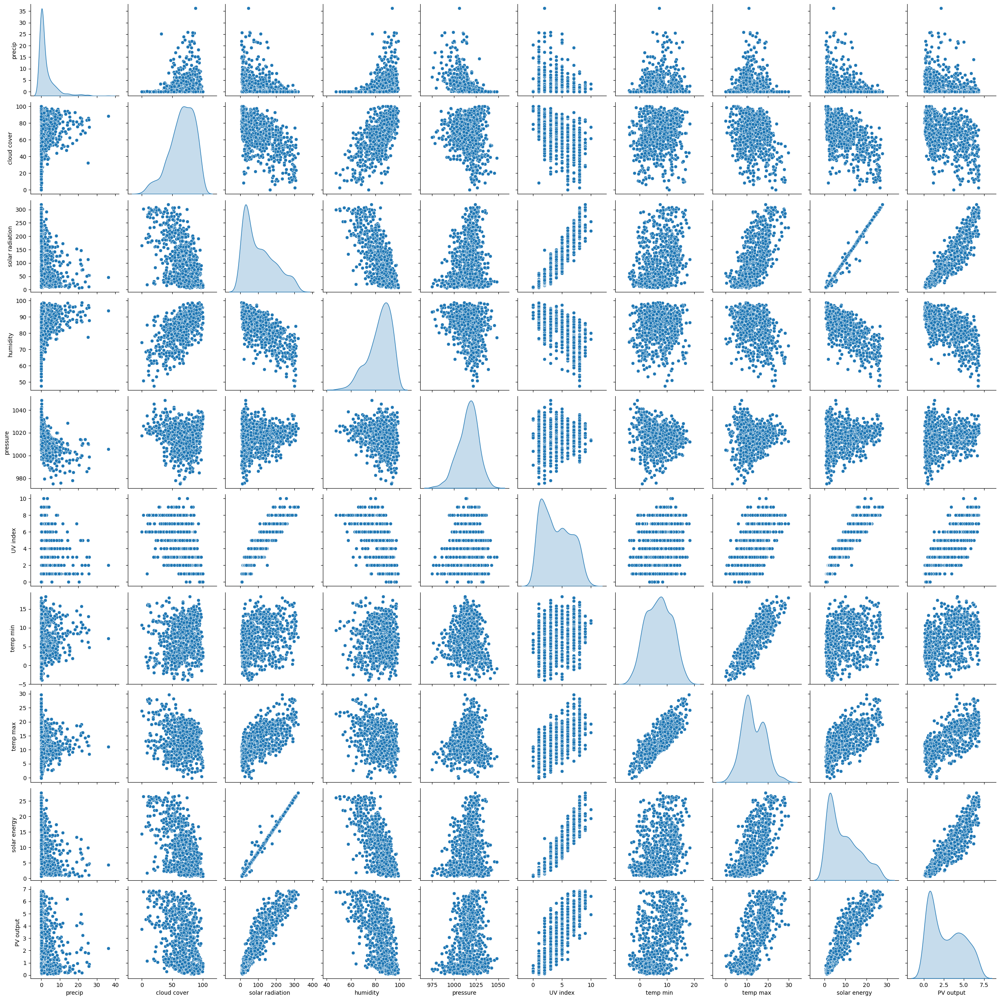

2025-02-14 15:41:03,673 - MainApp - INFO - bar chart to display the count of each of the category values of the UV 


2025-02-14 15:41:05,688 - MainApp - INFO - The standardizatrion method is selected for scaling the data
2025-02-14 15:41:05,689 - MainApp - INFO - box plot to look for the spread of data points around the central tendency
/home/mukullight/anaconda3/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning:

invalid value encountered in log



2025-02-14 15:41:05,751 - MainApp - INFO - Function eda_explore took 13.3766 seconds


,cloud cover,solar radiation,humidity,pressure,UV index,temp min,temp max,solar energy,PV output,precip
0,0.720,0.06624,0.773438,0.672578,0.2,0.216216,0.184564,0.062963,0.098602,0.000000
1,0.412,0.08952,0.669922,0.784447,0.2,0.126126,0.197987,0.118519,0.153642,0.113329
2,0.598,0.11296,0.681641,0.717599,0.3,0.270270,0.278523,0.111111,0.149080,0.000000
3,0.262,0.11712,0.837891,0.622101,0.3,0.220721,0.234899,0.111111,0.144518,0.091667
4,0.852,0.06176,0.855469,0.604366,0.2,0.261261,0.328859,0.059259,0.093304,0.125751
5,0.874,0.03840,0.839844,0.452933,0.1,0.549550,0.379195,0.037037,0.060927,1.467874
6,0.867,0.06816,0.816406,0.519782,0.1,0.486486,0.332215,0.055556,0.102723,0.198031
7,0.678,0.06784,0.701172,0.356071,0.2,0.432432,0.365772,0.066667,0.087123,1.501630
8,0.441,0.08096,0.564453,0.526603,0.2,0.288288,0.291946,0.081481,0.127447,2.221592
9,0.807,0.01312,0.839844,0.517053,0.1,0.283784,0.389262,0.011111,0.000000,2.036143


data_normalized has been saved as 'data_normalized.csv'


In [86]:
def data_clean_test():
    logger = Logger('MainApp', 'logs/app.log').get_logger()
    
    data_file = "solarPower_50m.csv"
    
    # Ensuring the file exists in the path
    if not os.path.exists(data_file):
        logger.error(f"The  '{data_file}'is not found in the path")
        return

    # Reading the dataframe
    df_pandas = pd.read_csv(data_file)
    result_pd = DataFrameUtils.load_data(df_pandas, logger=logger)
    result_pd = datacleaningutils.format_clean_columns(result_pd, logger=logger)
    logger.info("Displaying pandas location of the null values")
    datacleaningutils.dist_columns(result_pd, logger=logger)
    datacleaningutils.eda_explore(result_pd,logger=logger)
    result_pd["precip"] = np.log1p(result_pd["precip"])
    temp_rec = result_pd["precip"]
    result_pd = result_pd.drop("precip",axis=1)
    numeric_data = result_pd.select_dtypes(include=['float64', 'int64'])
    data_normalized = numeric_data.copy()
    minmax_scaler = MinMaxScaler()
    data_normalized[numeric_data.columns] = minmax_scaler.fit_transform(numeric_data)
    data_normalized["precip"] = temp_rec
    display(data_normalized.head(10))
    data_normalized.to_csv('data_normalized.csv', index=False)
    print("data_normalized has been saved as 'data_normalized.csv'")

if __name__ == "__main__":
    data_clean_test()


# step 3 -> Modeling

In [4]:
data = pd.read_csv("data_normalized.csv")
y = data["PV output"]
X = data.drop("PV output",axis=1)
# Evaluation functions
def fit_predict_regression(t):
    start_time = time.time()
    t.fit(x_train, y_train)
    end_time = time.time()
    print("Training time: ", end_time - start_time)
    start_time = time.time()
    y_test_predict = t.predict(x_test)
    end_time = time.time()
    print("Testing time: ", end_time - start_time)
    return y_test_predict

def plot_residuals_plotly(y_test, y_pred):
    residuals = y_test - y_pred
    
    # Create subplot figure with 1 row and 2 columns
    fig = make_subplots(
        rows=1, 
        cols=2,
        subplot_titles=('Residual Plot', 'Actual vs Predicted'),
        horizontal_spacing=0.1
    )
    
    # Residual plot
    fig.add_trace(
        go.Scatter(
            x=y_pred,
            y=residuals,
            mode='markers',
            opacity=0.5,
            marker=dict(size=6),
            name='Residuals',
            hovertemplate=
            '<b>Predicted</b>: %{x:.2f}<br>'+
            '<b>Residual</b>: %{y:.2f}<br>'
        ),
        row=1,
        col=1
    )
    
    # Add zero line to residual plot
    fig.add_hline(
        y=0,
        line_dash="dash",
        line_color="red",
        row=1,
        col=1
    )
    
    # Actual vs Predicted plot
    fig.add_trace(
        go.Scatter(
            x=y_test,
            y=y_pred,
            mode='markers',
            opacity=0.5,
            marker=dict(size=6),
            name='Predictions',
            hovertemplate=
            '<b>Actual</b>: %{x:.2f}<br>'+
            '<b>Predicted</b>: %{y:.2f}<br>'
        ),
        row=1,
        col=2
    )
    
    # Add diagonal line (perfect prediction line)
    min_val = min(y_test.min(), y_pred.min())
    max_val = max(y_test.max(), y_pred.max())
    fig.add_trace(
        go.Scatter(
            x=[min_val, max_val],
            y=[min_val, max_val],
            mode='lines',
            line=dict(color='red', dash='dash'),
            name='Perfect Prediction',
            showlegend=False
        ),
        row=1,
        col=2
    )
    
    # Update layout
    fig.update_layout(
        height=500,
        width=1000,
        showlegend=False,
        title_text="Regression Diagnostics"
    )
    
    # Update axes titles
    fig.update_xaxes(title_text="Predicted Values", row=1, col=1)
    fig.update_yaxes(title_text="Residuals", row=1, col=1)
    fig.update_xaxes(title_text="Actual Values", row=1, col=2)
    fig.update_yaxes(title_text="Predicted Values", row=1, col=2)
    
    fig.show()

def regression_metrics(y_test, y_pred):
    print("*********Regression Metrics*******")
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    print(f'Mean Squared Error (MSE): {mse:.3f}')
    print(f'Root Mean Squared Error (RMSE): {rmse:.3f}')
    print(f'Mean Absolute Error (MAE): {mae:.3f}')
    print(f'R² Score: {r2:.3f}')

def evaluating_model_regression(model, actual_val):
    print("*****Predicting values****")
    f = fit_predict_regression(model)
    print()
    print("******Evaluating model****")
    regression_metrics(actual_val, f)
    print()
    plot_residuals_plotly(actual_val, f)
    print("********")

# Generate synthetic regression data
np.random.seed(42)
n_samples = 1000


# Split the data
x_train, x_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Create different regression models
models = {
    'Linear Regression': LinearRegression(),
    'Ridge': Ridge(),
    'Lasso': Lasso(),
    'ElasticNet': ElasticNet(),
    'SVR': make_pipeline(StandardScaler(), SVR(C=1.0, epsilon=0.2)),
    'Decision Tree': DecisionTreeRegressor(),
    'Random Forest Regressor': RandomForestRegressor(),  # Fixed typo
    'Gradient Boosting': GradientBoostingRegressor()
}

# Evaluate each model
for name, model in models.items():
    print(f"\n=== Evaluating {name} ===\n")
    evaluating_model_regression(model, y_test)


=== Evaluating Linear Regression ===

*****Predicting values****
Training time:  0.0035681724548339844
Testing time:  0.0016391277313232422

******Evaluating model****
*********Regression Metrics*******
Mean Squared Error (MSE): 0.010
Root Mean Squared Error (RMSE): 0.100
Mean Absolute Error (MAE): 0.077
R² Score: 0.863



********

=== Evaluating Ridge ===

*****Predicting values****
Training time:  0.00213623046875
Testing time:  0.0007150173187255859

******Evaluating model****
*********Regression Metrics*******
Mean Squared Error (MSE): 0.010
Root Mean Squared Error (RMSE): 0.101
Mean Absolute Error (MAE): 0.078
R² Score: 0.862



********

=== Evaluating Lasso ===

*****Predicting values****
Training time:  0.0018742084503173828
Testing time:  0.0006744861602783203

******Evaluating model****
*********Regression Metrics*******
Mean Squared Error (MSE): 0.074
Root Mean Squared Error (RMSE): 0.272
Mean Absolute Error (MAE): 0.242
R² Score: -0.012



********

=== Evaluating ElasticNet ===

*****Predicting values****
Training time:  0.002378225326538086
Testing time:  0.0006670951843261719

******Evaluating model****
*********Regression Metrics*******
Mean Squared Error (MSE): 0.074
Root Mean Squared Error (RMSE): 0.272
Mean Absolute Error (MAE): 0.242
R² Score: -0.012



********

=== Evaluating SVR ===

*****Predicting values****
Training time:  0.005007028579711914
Testing time:  0.0010869503021240234

******Evaluating model****
*********Regression Metrics*******
Mean Squared Error (MSE): 0.014
Root Mean Squared Error (RMSE): 0.118
Mean Absolute Error (MAE): 0.098
R² Score: 0.809



********

=== Evaluating Decision Tree ===

*****Predicting values****
Training time:  0.0049364566802978516
Testing time:  0.0008795261383056641

******Evaluating model****
*********Regression Metrics*******
Mean Squared Error (MSE): 0.013
Root Mean Squared Error (RMSE): 0.115
Mean Absolute Error (MAE): 0.087
R² Score: 0.820



********

=== Evaluating Random Forest Regressor ===

*****Predicting values****
Training time:  0.3364830017089844
Testing time:  0.004760026931762695

******Evaluating model****
*********Regression Metrics*******
Mean Squared Error (MSE): 0.008
Root Mean Squared Error (RMSE): 0.092
Mean Absolute Error (MAE): 0.070
R² Score: 0.884



********

=== Evaluating Gradient Boosting ===

*****Predicting values****
Training time:  0.2008974552154541
Testing time:  0.002519369125366211

******Evaluating model****
*********Regression Metrics*******
Mean Squared Error (MSE): 0.009
Root Mean Squared Error (RMSE): 0.093
Mean Absolute Error (MAE): 0.071
R² Score: 0.882



********


# DeepFCNN Architecture Table

| Layer Number | Layer Type          | Input Dim       | Output Dim      | Parameters       | Purpose                                                                 |
|--------------|---------------------|-----------------|-----------------|------------------|-------------------------------------------------------------------------|
| 1            | Linear              | [batch_size, 9] | [batch_size, 128] | 9*128 + 128 = 1,280 | Expands feature space to capture complex patterns                       |
| 2            | BatchNorm1d         | [batch_size, 128] | [batch_size, 128] | 256              | Normalizes layer inputs for stable training, reduces covariate shift    |
| 3            | ReLU                | [batch_size, 128] | [batch_size, 128] | 0                | Introduces non-linearity to learn complex patterns                      |
| 4            | Dropout (p=0.3)     | [batch_size, 128] | [batch_size, 128] | 0                | Prevents overfitting by randomly dropping 30% of outputs                |
| 5            | Linear              | [batch_size, 128] | [batch_size, 64] | 128*64 + 64 = 8,256 | Compresses representation while retaining important features            |
| 6            | BatchNorm1d         | [batch_size, 64] | [batch_size, 64] | 128              | Normalizes layer inputs for stable training                             |
| 7            | ReLU                | [batch_size, 64] | [batch_size, 64] | 0                | Introduces non-linearity                                                |
| 8            | Dropout (p=0.3)     | [batch_size, 64] | [batch_size, 64] | 0                | Prevents overfitting by randomly dropping 30% of outputs                |
| 9            | Linear              | [batch_size, 64] | [batch_size, 32] | 64*32 + 32 = 2,080 | Further refines feature representation                                  |
| 10           | BatchNorm1d         | [batch_size, 32] | [batch_size, 32] | 64               | Normalizes layer inputs for stable training                             |
| 11           | ReLU                | [batch_size, 32] | [batch_size, 32] | 0                | Introduces non-linearity                                                |
| 12           | Dropout (p=0.2)     | [batch_size, 32] | [batch_size, 32] | 0                | Prevents overfitting by randomly dropping 20% of outputs                |
| 13           | Linear              | [batch_size, 32] | [batch_size, 1]  | 32*1 + 1 = 33    | Produces final regression output (PV output prediction)                 |

## Table Notes
- **Input Dim and Output Dim**: Represent the shape of the data at each layer, where `batch_size` is the number of samples in a batch.
- **Parameters**: Calculated as `input_dim * output_dim + output_dim` for linear layers (weights + biases), and scale/shift parameters for BatchNorm1d.
- **Total Parameters**: ~11,997 (sum of all layer parameters).
- **Purpose**: Explains the role of each layer in the context of regression tasks like PV output prediction.

## Key Features
- **Deeper Architecture**: Three hidden layers (128 → 64 → 32) capture hierarchical features.
- **Batch Normalization**: Stabilizes training and allows for deeper networks.
- **Dropout**: Prevents overfitting, with higher rates (0.3) in early layers and lower (0.2) near the output.
- **ReLU Activation**: Introduces non-linearity for complex pattern learning.

## Usage
- Suitable for non-sequential tabular data with complex, non-linear patterns.
- Use early stopping and validation loss monitoring to tune hyperparameters (e.g., dropout rates, layer sizes).

In [15]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import mean_squared_error, r2_score

# Define the DeepFCNN model
class DeepFCNN(nn.Module):
    def __init__(self, input_size=9):  # Fixed: Changed 'init' to '__init__'
        super(DeepFCNN, self).__init__()  # Fixed: Corrected super() call
        self.layers = nn.Sequential(
            nn.Linear(input_size, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(64, 32),
            nn.BatchNorm1d(32),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(32, 1)  # Linear output for regression
        )
    
    def forward(self, x):
        return self.layers(x)

# Load and preprocess data (non-sequential for DeepFCNN)
df = pd.read_csv("data_normalized.csv")
y = df["PV output"].values.reshape(-1, 1)
X = df.drop("PV output", axis=1).values

# Create scalers
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_scaled = scaler_X.fit_transform(X)
y_scaled = scaler_y.fit_transform(y)

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=42)

# Convert to PyTorch tensors
X_train_tensor = torch.FloatTensor(X_train)
y_train_tensor = torch.FloatTensor(y_train)
X_test_tensor = torch.FloatTensor(X_test)
y_test_tensor = torch.FloatTensor(y_test)

# Create DataLoader for batching
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Initialize the model, criterion, and optimizer
model = DeepFCNN(input_size=9)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)  # Increased lr for faster convergence

# Training function
def train_model(model, train_loader, test_loader, num_epochs=50):
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0
        for X_batch, y_batch in train_loader:
            optimizer.zero_grad()
            y_pred = model(X_batch)
            loss = criterion(y_pred, y_batch)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
        
        # Validation
        model.eval()
        test_loss = 0
        with torch.no_grad():
            for X_batch, y_batch in test_loader:
                y_pred = model(X_batch)
                loss = criterion(y_pred, y_batch)
                test_loss += loss.item()
        
        print(f'Epoch {epoch+1}, Train Loss: {train_loss/len(train_loader):.4f}, Test Loss: {test_loss/len(test_loader):.4f}')

# Evaluation function
def evaluate_model(model, test_loader, scaler_y):
    model.eval()
    predictions = []
    actuals = []
    
    with torch.no_grad():
        for X_batch, y_batch in test_loader:
            y_pred = model(X_batch)
            predictions.append(y_pred.numpy())
            actuals.append(y_batch.numpy())
    
    predictions = np.concatenate(predictions, axis=0)
    actuals = np.concatenate(actuals, axis=0)
    
    predictions = scaler_y.inverse_transform(predictions)
    actuals = scaler_y.inverse_transform(actuals)
    
    mse = mean_squared_error(actuals, predictions)
    rmse = np.sqrt(mse)
    r2 = r2_score(actuals, predictions)
    
    print(f'MSE: {mse:.4f}')
    print(f'RMSE: {rmse:.4f}')
    print(f'R²: {r2:.4f}')
    
    return mse, rmse, r2

# Train and evaluate the model
train_model(model, train_loader, test_loader, num_epochs=1000)
print("\nFinal Test Metrics:")
mse, rmse, r2 = evaluate_model(model, test_loader, scaler_y)

Epoch 1, Train Loss: 1.0859, Test Loss: 0.6332
Epoch 2, Train Loss: 0.7966, Test Loss: 0.4138
Epoch 3, Train Loss: 0.5979, Test Loss: 0.3197
Epoch 4, Train Loss: 0.4738, Test Loss: 0.2656
Epoch 5, Train Loss: 0.4324, Test Loss: 0.2229
Epoch 6, Train Loss: 0.3722, Test Loss: 0.1938
Epoch 7, Train Loss: 0.3709, Test Loss: 0.1820
Epoch 8, Train Loss: 0.3233, Test Loss: 0.1664
Epoch 9, Train Loss: 0.3042, Test Loss: 0.1547
Epoch 10, Train Loss: 0.3210, Test Loss: 0.1522
Epoch 11, Train Loss: 0.2928, Test Loss: 0.1450
Epoch 12, Train Loss: 0.3005, Test Loss: 0.1388
Epoch 13, Train Loss: 0.2793, Test Loss: 0.1225
Epoch 14, Train Loss: 0.2828, Test Loss: 0.1226
Epoch 15, Train Loss: 0.2967, Test Loss: 0.1210
Epoch 16, Train Loss: 0.2671, Test Loss: 0.1173
Epoch 17, Train Loss: 0.2440, Test Loss: 0.1108
Epoch 18, Train Loss: 0.2678, Test Loss: 0.1125
Epoch 19, Train Loss: 0.2613, Test Loss: 0.1109
Epoch 20, Train Loss: 0.2476, Test Loss: 0.1112
Epoch 21, Train Loss: 0.2256, Test Loss: 0.1054
E

# the CNN model is selected and the accuracy is almost 90%

## Q2 - Extracting data using LLMs

The accompanying PDF file is a data sheet that gives specifications for a number of hardware products available from GivEnergy. Use an open source Large Language Model of your choice to run inference optimally on a single or multi-node cluster to extract the data from this pdf to the best of its ability. Please provide a record of the prompts you use in your interaction with the LLM.



In [ ]:

load_dotenv()
if "UNSTRUCTURED_API_KEY" not in os.environ or not os.getenv("UNSTRUCTURED_API_KEY"):
    os.environ["UNSTRUCTURED_API_KEY"] = getpass.getpass("Enter your Unstructured API key: ")
api_key = os.getenv("UNSTRUCTURED_API_KEY")
if api_key:
    print("API key loaded successfully.")
else:
    print("Failed to load API key.")

API key loaded successfully.


In [8]:
from langchain_unstructured import UnstructuredLoader
from unstructured.cleaners.core import clean_extra_whitespace

loader = UnstructuredLoader(
    "Giv - Data Sheet.pdf",
    post_processors=[clean_extra_whitespace],
)

docs = loader.load()

extracted_elements = []
for doc in docs:
    # Try to get the element id directly, or from metadata if available.
    element_id = getattr(doc, "id", None)
    if element_id is None and hasattr(doc, "metadata"):
        element_id = doc.metadata.get("id", None)
    
    extracted_elements.append({
        "id": element_id,
        "page_content": doc.page_content
    })

print(extracted_elements)

[{'id': None, 'page_content': 'GivEnergy R'}, {'id': None, 'page_content': 'Energy Storage Systems'}, {'id': None, 'page_content': 'Advanced Online Monitoring'}, {'id': None, 'page_content': 'Wi-Fi or 3G connectivity'}, {'id': None, 'page_content': 'Suitable for new solar installations'}, {'id': None, 'page_content': 'Brackets and ﬁxings included'}, {'id': None, 'page_content': '3 kW, 3.6 kW and 5 kW inverters'}, {'id': None, 'page_content': 'IP65 for multiple siting options'}, {'id': None, 'page_content': '2.6 kWh, 5.2 kWh and 8.2 kWh modules'}, {'id': None, 'page_content': 'Flexible rate tariﬀ compatible'}, {'id': None, 'page_content': 'Dual MPPT'}, {'id': None, 'page_content': 'Low maintenance design'}, {'id': None, 'page_content': 'https://www.givenergy.co.uk'}, {'id': None, 'page_content': 'AC Coupled'}, {'id': None, 'page_content': 'Output Data (AC) Nominal AC Output Power Max AC Apparent Power Max Output Current AC Nominal Voltage Range AC Grid Frequency Range Power Factor At Ra

In [15]:
import json
from langchain_unstructured import UnstructuredLoader
from unstructured.cleaners.core import clean_extra_whitespace
from langchain_core.prompts import ChatPromptTemplate
from langchain_ollama.llms import OllamaLLM

# Load and preprocess the PDF file
def load_document(extracted_elements):

    return extracted_elements

def query_llm_for_structuring(extracted_text):
    """
    Send the extracted unstructured text along with a system prompt to the LLM.
    The LLM is instructed to parse the datasheet and output a structured JSON object.
    """
    system_prompt = """You are a specialized LLM that extracts key information from json files.
Analyze the provided text (extracted from a GivEnergy datasheet) and produce a structured response of page content 
if necessary match the rows with there values
display the entire text in a structured format 


    """
    # Create a prompt template
    prompt = ChatPromptTemplate.from_template("{input}")
    
    # Initialize the model (using Llama 3)
    model = OllamaLLM(model="deepseek-r1:8b")
    
    # Create a chain by combining the prompt and model
    chain = prompt | model
    
    # Build the full input by appending the extracted text to the system prompt
    full_input = f"{system_prompt}\n\n{extracted_text}"
    
    # Invoke the chain with the full input
    response = chain.invoke({"input": full_input})
    
    # Parse the response as JSON and return it
    return response

def main():
    try:
        pdf_text = load_document(extracted_elements=extracted_elements)
        structured_data = query_llm_for_structuring(pdf_text)
        print(structured_data)


    except Exception as e:
        print("An error occurred during processing:", e)

if __name__ == "__main__":
    main()


INFO: HTTP Request: POST http://127.0.0.1:11434/api/generate "HTTP/1.1 200 OK"


<think>
Okay, so I'm trying to figure out how to help the user with their query. They provided a bunch of data in this format that looks like it's from some product specs or maybe a catalog. The user wrote "Please provide a summary..." but didn't specify what exactly they want summarized.

First, I need to understand what kind of information is here. It seems like each entry has things like capacity, voltage, current, technology, BMS info, operating temperatures, warranty, and other specs like weight, dimensions, etc. There are entries for different models, maybe Bat 2.6, Bat 5.2, Bat 8.2? Or perhaps it's part of a series with "Bat" as the model identifier.

The user might be looking to compare these products or get an overview. They could be a buyer trying to decide which model suits their needs, someone in product management wanting a quick reference, or maybe even someone doing market research.

Since the data is quite technical, the summary should probably highlight key features li

In [ ]:
# i personally do not have access to api keys of top model providers like grok, anothropic and open ai 
# the unstructured data when passed through major llm providers produced very promising responses